In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
df=pd.read_csv('diabetes_dataset.csv')

In [4]:
df.iloc[0] 


age                                             58
gender                                        Male
ethnicity                                    Asian
education_level                         Highschool
income_level                          Lower-Middle
employment_status                         Employed
smoking_status                               Never
alcohol_consumption_per_week                     0
physical_activity_minutes_per_week             215
diet_score                                     5.7
sleep_hours_per_day                            7.9
screen_time_hours_per_day                      7.9
family_history_diabetes                          0
hypertension_history                             0
cardiovascular_history                           0
bmi                                           30.5
waist_to_hip_ratio                            0.89
systolic_bp                                    134
diastolic_bp                                    78
heart_rate                     

In [5]:
df.shape

(100000, 31)

In [6]:
df.info()    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 31 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 100000 non-null  int64  
 1   gender                              100000 non-null  object 
 2   ethnicity                           100000 non-null  object 
 3   education_level                     100000 non-null  object 
 4   income_level                        100000 non-null  object 
 5   employment_status                   100000 non-null  object 
 6   smoking_status                      100000 non-null  object 
 7   alcohol_consumption_per_week        100000 non-null  int64  
 8   physical_activity_minutes_per_week  100000 non-null  int64  
 9   diet_score                          100000 non-null  float64
 10  sleep_hours_per_day                 100000 non-null  float64
 11  screen_time_hours_per_day  

In [7]:
df.drop(['diabetes_risk_score','diabetes_stage'],inplace=True,axis=1)

In [8]:
df.describe()

,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,family_history_diabetes,hypertension_history,cardiovascular_history,bmi,...,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diagnosed_diabetes
count,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,...,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000
mean,50.12041,2.003670,118.911640,5.994787,6.997818,5.996468,0.219410,0.250800,0.079200,25.612653,...,69.632870,185.978110,54.042790,103.000430,121.462650,111.11712,160.035050,9.061242,6.520776,0.599980
std,15.60460,1.417779,84.409662,1.780954,1.094622,2.468406,0.413849,0.433476,0.270052,3.586705,...,8.371954,32.013005,10.267374,33.390256,43.372619,13.59561,30.935472,4.954060,0.813921,0.489904
min,18.00000,0.000000,0.000000,0.000000,3.000000,0.500000,0.000000,0.000000,0.000000,15.000000,...,40.000000,100.000000,20.000000,50.000000,30.000000,60.00000,70.000000,2.000000,4.000000,0.000000
25%,39.00000,1.000000,57.000000,4.800000,6.300000,4.300000,0.000000,0.000000,0.000000,23.200000,...,64.000000,164.000000,47.000000,78.000000,91.000000,102.00000,139.000000,5.090000,5.970000,0.000000
50%,50.00000,2.000000,100.000000,6.000000,7.000000,6.000000,0.000000,0.000000,0.000000,25.600000,...,70.000000,186.000000,54.000000,102.000000,121.000000,111.00000,160.000000,8.790000,6.520000,1.000000
75%,61.00000,3.000000,160.000000,7.200000,7.700000,7.700000,0.000000,1.000000,0.000000,28.000000,...,75.000000,208.000000,61.000000,126.000000,151.000000,120.00000,181.000000,12.450000,7.070000,1.000000
max,90.00000,10.000000,833.000000,10.000000,10.000000,16.800000,1.000000,1.000000,1.000000,39.200000,...,105.000000,318.000000,98.000000,263.000000,344.000000,172.00000,287.000000,32.220000,9.800000,1.000000


In [25]:
for i in df.columns:
    print(i,'  ',df[i].unique())

age    [58 48 60 74 46 75 62 42 59 43 54 19 22 41 34 55 35 27 73 51 52 32 56 40
 45 80 50 33 63 30 53 29 26 38 67 44 39 66 65 37 47 31 72 49 18 89 68 28
 85 25 71 24 61 69 57 36 90 64 87 20 84 78 70 76 83 79 23 81 77 21 86 82
 88]
gender    ['Male' 'Female' 'Other']
ethnicity    ['Asian' 'White' 'Hispanic' 'Black' 'Other']
education_level    ['Highschool' 'Graduate' 'Postgraduate' 'No formal']
income_level    ['Lower-Middle' 'Middle' 'Low' 'Upper-Middle' 'High']
employment_status    ['Employed' 'Unemployed' 'Retired' 'Student']
smoking_status    ['Never' 'Former' 'Current']
alcohol_consumption_per_week    [ 0  1  2  3  6  5  4  9  8  7 10]
physical_activity_minutes_per_week    [215 143  57  49 109 124  53  75 114  86 118 167  13 364 105  99  31  54
  14 164 128 147 241 185  78 148  88  29 115 182 106 113  51 170  72 133
  34  59 123  71  91  17 175  30  39  77 121 240  80 188  85  56  61  47
  62 180 135 287  73  18 156  74  69 155  97 144 228  60 237 194  44  63
  43 126 103 142  83  

In [ ]:
categorical_cols = [
    'gender', 'ethnicity', 'education_level',
    'income_level', 'employment_status',
    'smoking_status'
]

df_encoded = pd.get_dummies(df, columns=categorical_cols)

print(df_encoded.head())


   age  alcohol_consumption_per_week  physical_activity_minutes_per_week  \
0   58                             0                                 215   
1   48                             1                                 143   
2   60                             1                                  57   
3   74                             0                                  49   
4   46                             1                                 109   

   diet_score  sleep_hours_per_day  screen_time_hours_per_day  \
0         5.7                  7.9                        7.9   
1         6.7                  6.5                        8.7   
2         6.4                 10.0                        8.1   
3         3.4                  6.6                        5.2   
4         7.2                  7.4                        5.0   

   family_history_diabetes  hypertension_history  cardiovascular_history  \
0                        0                     0                       0   


In [10]:
import pandas as pd

def iqr_capping(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        df[col] = df[col].apply(lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))
    return df

numerical_cols = df_encoded.select_dtypes(include=['int64', 'float64']).columns.tolist()

df_capped = iqr_capping(df_encoded, numerical_cols)



In [11]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


In [12]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

y = df_capped['diagnosed_diabetes']
X = df_capped.drop(columns=['diagnosed_diabetes'])



In [23]:
X.columns

Index(['age', 'alcohol_consumption_per_week',
       'physical_activity_minutes_per_week', 'diet_score',
       'sleep_hours_per_day', 'screen_time_hours_per_day',
       'family_history_diabetes', 'hypertension_history',
       'cardiovascular_history', 'bmi', 'waist_to_hip_ratio', 'systolic_bp',
       'diastolic_bp', 'heart_rate', 'cholesterol_total', 'hdl_cholesterol',
       'ldl_cholesterol', 'triglycerides', 'glucose_fasting',
       'glucose_postprandial', 'insulin_level', 'hba1c', 'gender_Female',
       'gender_Male', 'gender_Other', 'ethnicity_Asian', 'ethnicity_Black',
       'ethnicity_Hispanic', 'ethnicity_Other', 'ethnicity_White',
       'education_level_Graduate', 'education_level_Highschool',
       'education_level_No formal', 'education_level_Postgraduate',
       'income_level_High', 'income_level_Low', 'income_level_Lower-Middle',
       'income_level_Middle', 'income_level_Upper-Middle',
       'employment_status_Employed', 'employment_status_Retired',
       'em

In [14]:

df_full = X.copy()
df_full['diagnosed_diabetes'] = y


In [15]:

min_count = df_full['diagnosed_diabetes'].value_counts().min()

balanced_df = df_full.groupby('diagnosed_diabetes').sample(n=min_count, random_state=42)

X_balanced = balanced_df.drop(columns=['diagnosed_diabetes'])
y_balanced = balanced_df['diagnosed_diabetes']


In [16]:

X_train, X_test, y_train, y_test = train_test_split(
    X_balanced, y_balanced, test_size=0.2, random_state=42, stratify=y_balanced
)


In [17]:

num_cols = X_train.select_dtypes(include=['int64', 'float64']).columns
scaler = StandardScaler()
X_train[num_cols] = pd.DataFrame(
    scaler.fit_transform(X_train[num_cols]), columns=num_cols, index=X_train.index
)
X_test[num_cols] = pd.DataFrame(
    scaler.transform(X_test[num_cols]), columns=num_cols, index=X_test.index
)


In [18]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

models = {
    'Random Forest': RandomForestClassifier(
        n_estimators=100,
        random_state=42,
        bootstrap=True,
        max_samples=0.8,
        max_features=0.7,
    ),

    'Logistic Regression': LogisticRegression(
        max_iter=1000,
        random_state=42,
    )
}


In [19]:
for name, model in models.items():
    model.fit(X_train, y_train) 
    y_pred = model.predict(X_test)
    print(f"---{name}---")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Classification Report:\n", classification_report(y_test, y_pred))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    print("\n")

---Random Forest---
Accuracy: 0.935691519280045
Classification Report:
               precision    recall  f1-score   support

           0       0.89      1.00      0.94      8001
           1       1.00      0.87      0.93      8000

    accuracy                           0.94     16001
   macro avg       0.94      0.94      0.94     16001
weighted avg       0.94      0.94      0.94     16001

Confusion Matrix:
 [[8000    1]
 [1028 6972]]


---Logistic Regression---
Accuracy: 0.8905068433222924
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.90      0.89      8001
           1       0.90      0.88      0.89      8000

    accuracy                           0.89     16001
   macro avg       0.89      0.89      0.89     16001
weighted avg       0.89      0.89      0.89     16001

Confusion Matrix:
 [[7233  768]
 [ 984 7016]]




In [20]:
import pickle

pipeline = {
    'model': models['Random Forest'],  
    'scaler': scaler,                
    'features': [
        'age', 'alcohol_consumption_per_week', 'physical_activity_minutes_per_week',
        'diet_score', 'sleep_hours_per_day', 'screen_time_hours_per_day',
        'family_history_diabetes', 'hypertension_history', 'cardiovascular_history',
        'bmi', 'waist_to_hip_ratio', 'systolic_bp', 'diastolic_bp', 'heart_rate',
        'cholesterol_total', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides',
        'glucose_fasting', 'glucose_postprandial', 'insulin_level', 'hba1c',
        'gender_Female', 'gender_Male', 'gender_Other',
        'ethnicity_Asian', 'ethnicity_Black', 'ethnicity_Hispanic', 'ethnicity_Other', 'ethnicity_White',
        'education_level_Graduate', 'education_level_Highschool', 'education_level_No formal', 'education_level_Postgraduate',
        'income_level_High', 'income_level_Low', 'income_level_Lower-Middle', 'income_level_Middle', 'income_level_Upper-Middle',
        'employment_status_Employed', 'employment_status_Retired', 'employment_status_Student', 'employment_status_Unemployed',
        'smoking_status_Current', 'smoking_status_Former', 'smoking_status_Never'
    ]
}

# Save pipeline
with open('diabetes_pipeline.pkl', 'wb') as f:
    pickle.dump(pipeline, f)


In [17]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Make a copy of the original dataframe
df_encoded1 = df.copy()

categorical_cols = [
    'gender', 'ethnicity', 'education_level',
    'income_level', 'employment_status',
    'smoking_status'
]

le = LabelEncoder()

for col in categorical_cols:
    if col in df_encoded1.columns:  # check if column exists
        df_encoded1[col] = le.fit_transform(df_encoded1[col])


In [18]:
df_encoded1.head()

,age,gender,ethnicity,education_level,income_level,employment_status,smoking_status,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,...,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diagnosed_diabetes
0,58,1,0,1,2,0,2,0,215,5.7,...,68,239,41,160,145,136,236,6.36,8.18,1
1,48,0,4,1,3,0,1,1,143,6.7,...,67,116,55,50,30,93,150,2.00,5.63,0
2,60,1,2,1,3,3,2,1,57,6.4,...,74,213,66,99,36,118,195,5.07,7.51,1
3,74,0,1,1,1,1,2,0,49,3.4,...,68,171,50,79,140,139,253,5.28,9.03,1
4,46,1,4,0,3,1,2,1,109,7.2,...,67,210,52,125,160,137,184,12.74,7.20,1


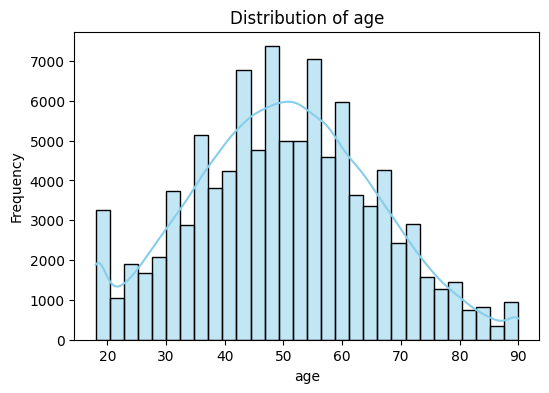

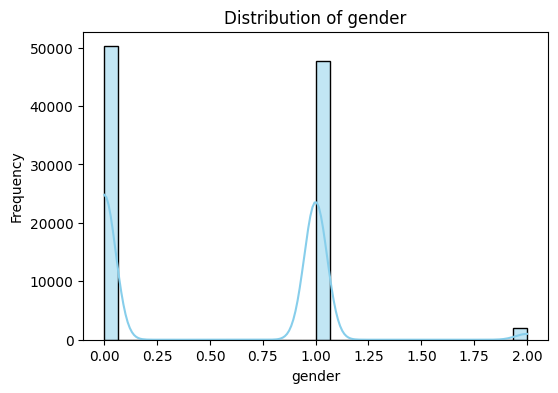

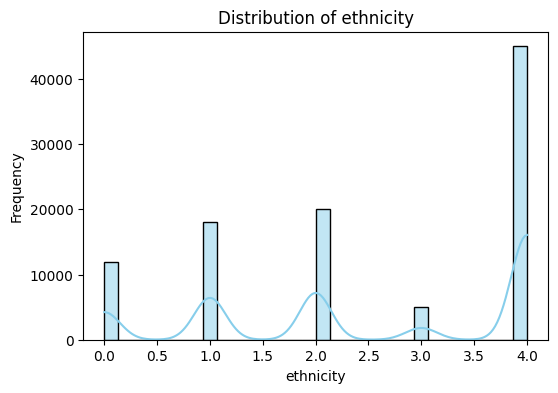

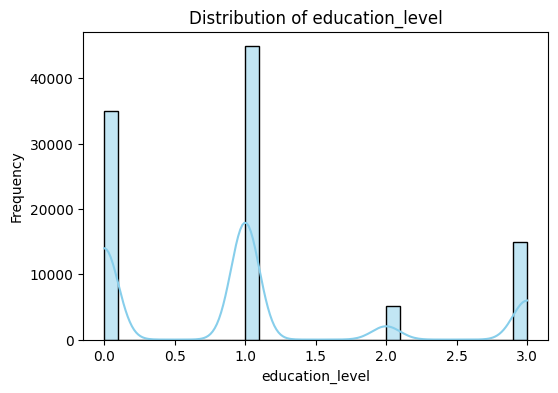

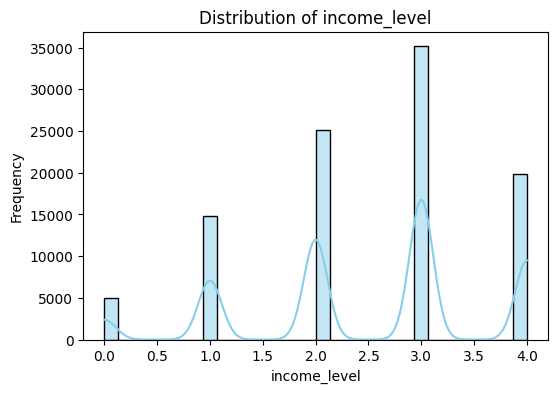

...

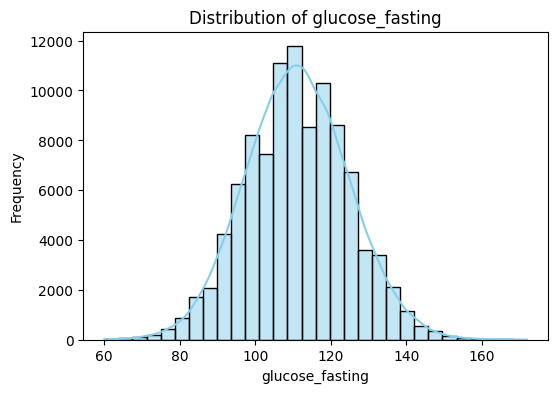

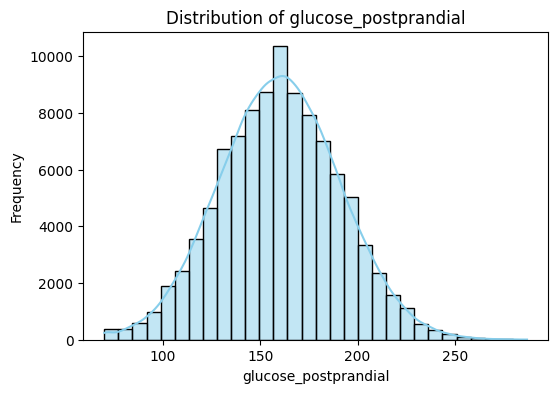

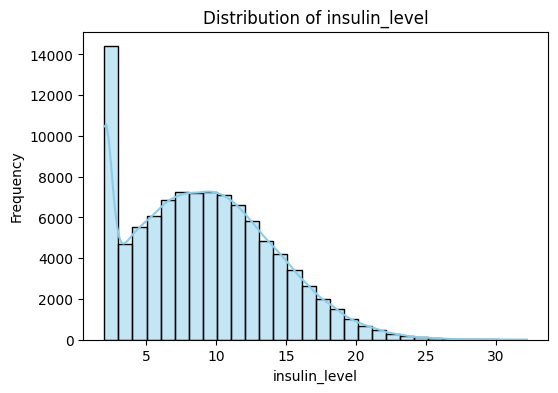

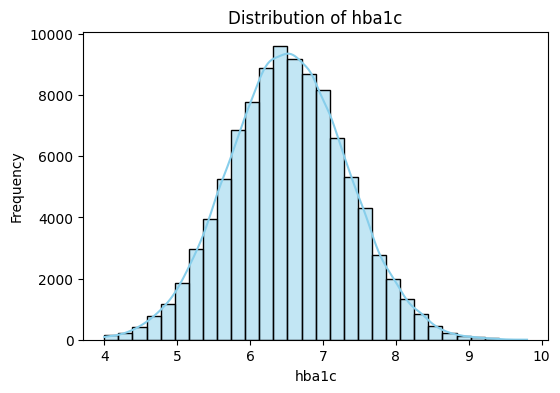

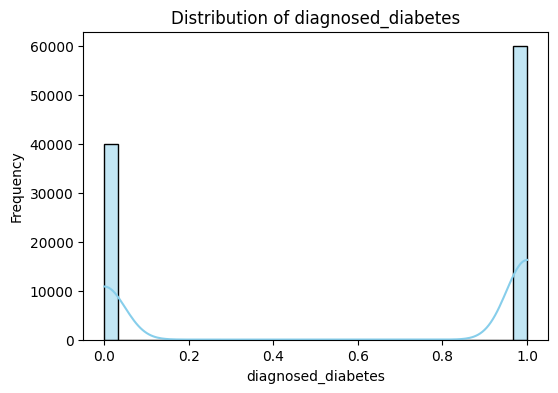

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select numerical columns
num_cols = df_encoded1.select_dtypes(include=['int64', 'float64']).columns

# Plot distributions using a loop
for col in num_cols:
    plt.figure(figsize=(6,4))
    sns.histplot(df_encoded1[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()


In [20]:
df_encoded1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 29 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 100000 non-null  int64  
 1   gender                              100000 non-null  int64  
 2   ethnicity                           100000 non-null  int64  
 3   education_level                     100000 non-null  int64  
 4   income_level                        100000 non-null  int64  
 5   employment_status                   100000 non-null  int64  
 6   smoking_status                      100000 non-null  int64  
 7   alcohol_consumption_per_week        100000 non-null  int64  
 8   physical_activity_minutes_per_week  100000 non-null  int64  
 9   diet_score                          100000 non-null  float64
 10  sleep_hours_per_day                 100000 non-null  float64
 11  screen_time_hours_per_day  

In [21]:
df_encoded1.isnull().sum()

age                                   0
gender                                0
ethnicity                             0
education_level                       0
income_level                          0
employment_status                     0
smoking_status                        0
alcohol_consumption_per_week          0
physical_activity_minutes_per_week    0
diet_score                            0
sleep_hours_per_day                   0
screen_time_hours_per_day             0
family_history_diabetes               0
hypertension_history                  0
cardiovascular_history                0
bmi                                   0
waist_to_hip_ratio                    0
systolic_bp                           0
diastolic_bp                          0
heart_rate                            0
cholesterol_total                     0
hdl_cholesterol                       0
ldl_cholesterol                       0
triglycerides                         0
glucose_fasting                       0


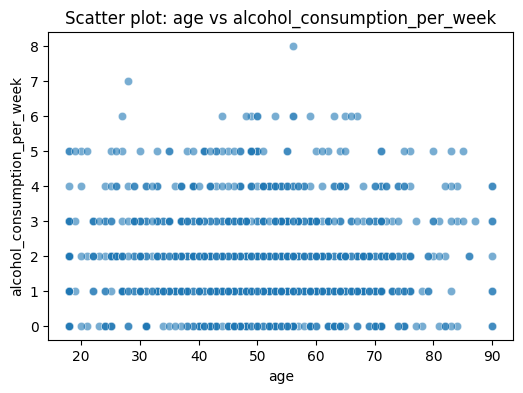

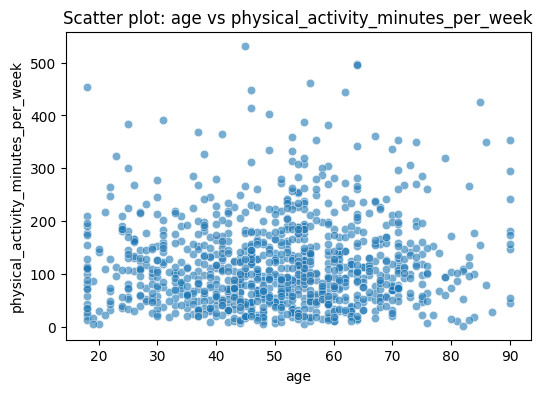

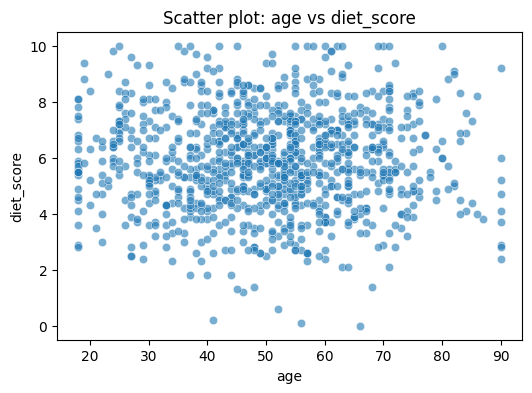

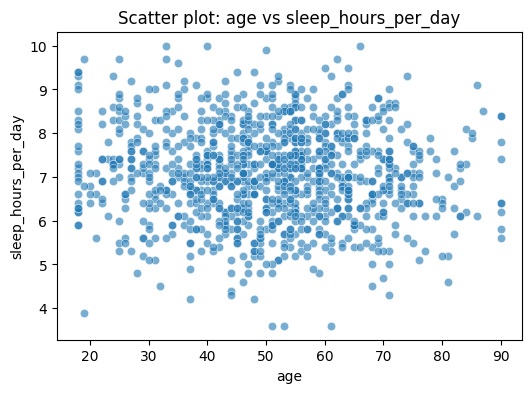

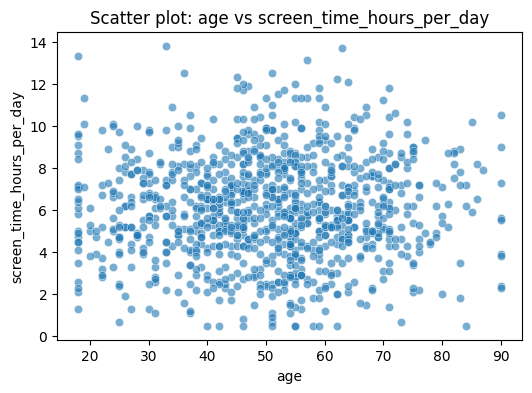

...

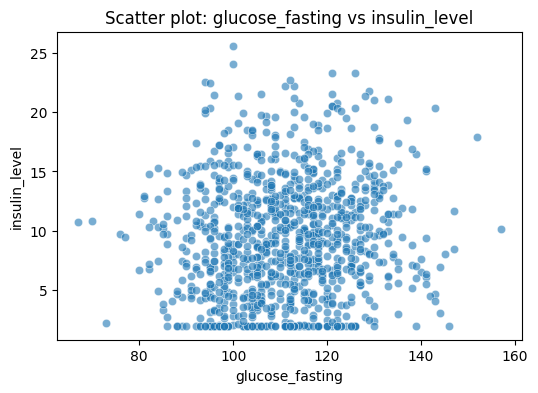

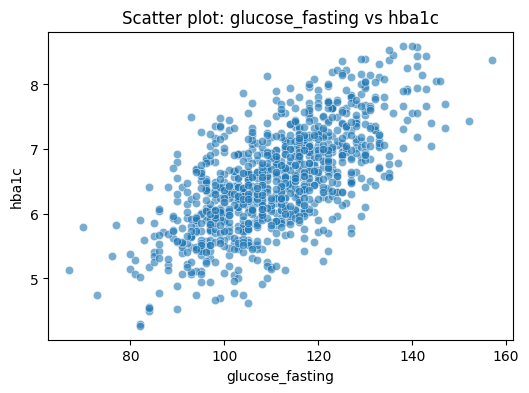

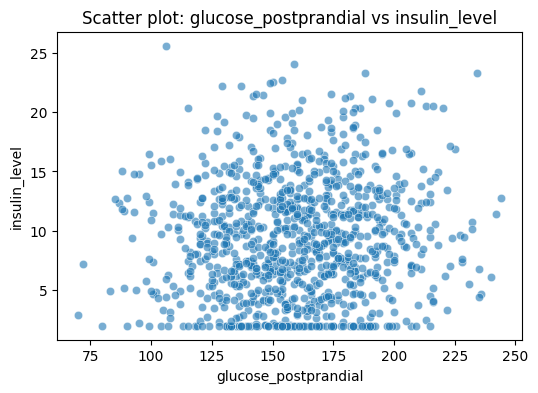

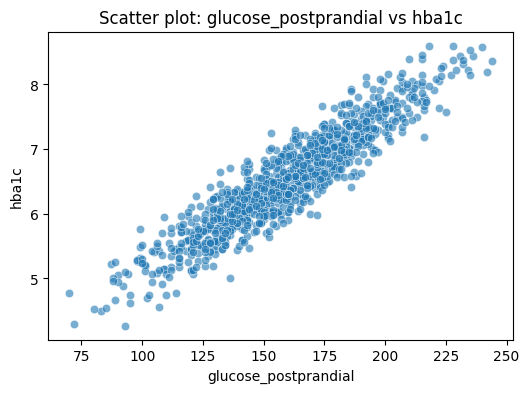

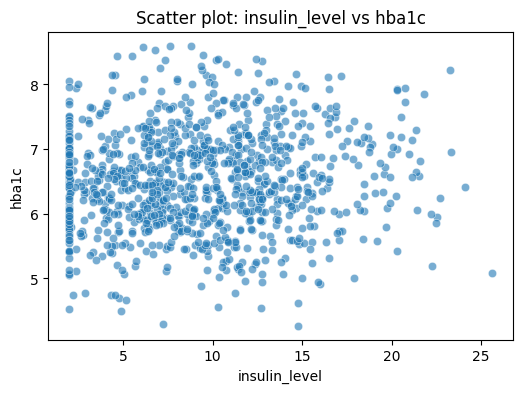

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations, cycle

# Select numerical columns
num_cols = [
    'age', 'alcohol_consumption_per_week', 'physical_activity_minutes_per_week',
    'diet_score', 'sleep_hours_per_day', 'screen_time_hours_per_day',
    'family_history_diabetes', 'hypertension_history', 'cardiovascular_history',
    'bmi', 'waist_to_hip_ratio', 'systolic_bp', 'diastolic_bp', 'heart_rate',
    'cholesterol_total', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides',
    'glucose_fasting', 'glucose_postprandial', 'insulin_level', 'hba1c'
]

# Optional: sample for faster plotting
sample_data = df_encoded1[num_cols].sample(1000, random_state=42)



# Loop through all pairs
for col_x, col_y in combinations(num_cols, 2):
    plt.figure(figsize=(6,4))
    sns.scatterplot(
        x=sample_data[col_x],
        y=sample_data[col_y],
        alpha=0.6,
    )
    plt.xlabel(col_x)
    plt.ylabel(col_y)
    plt.title(f'Scatter plot: {col_x} vs {col_y}')
    plt.show()


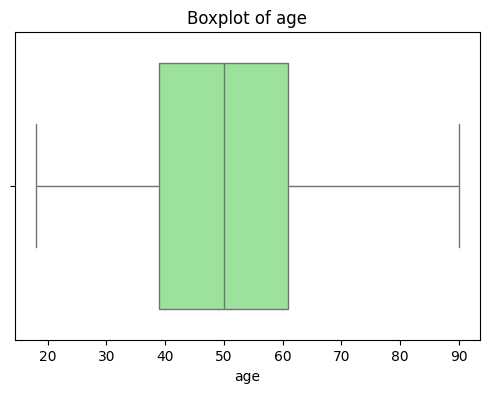

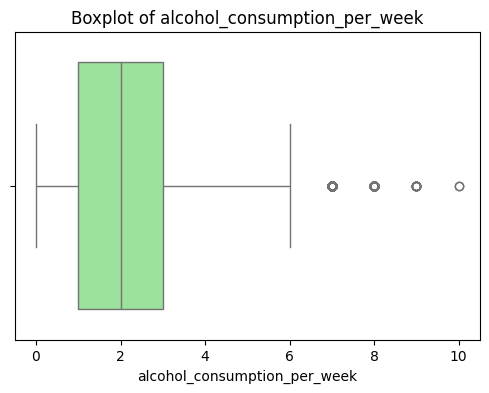

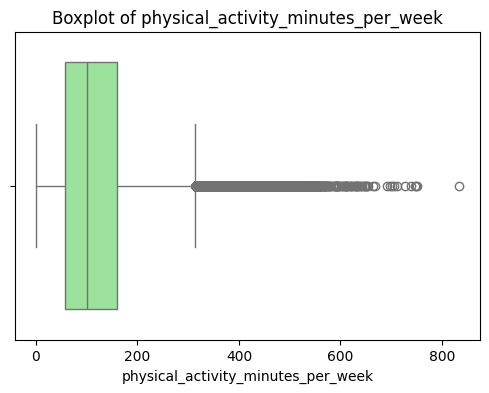

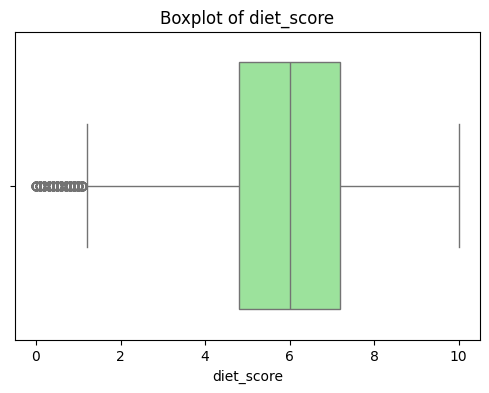

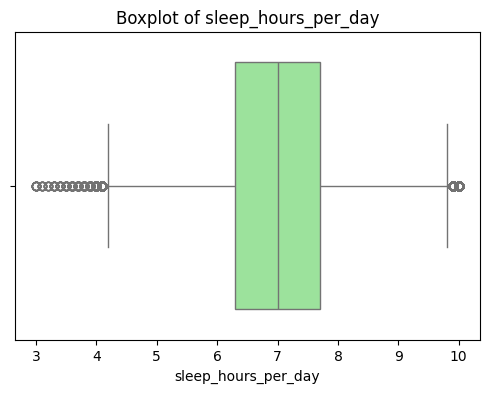

...

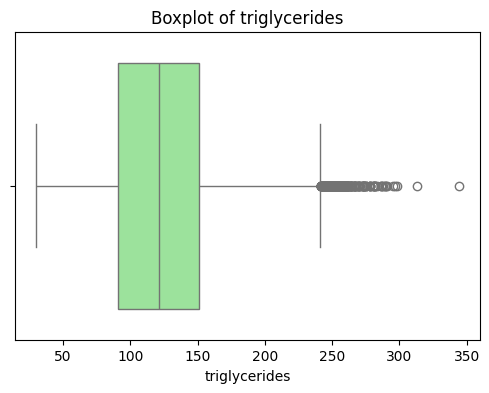

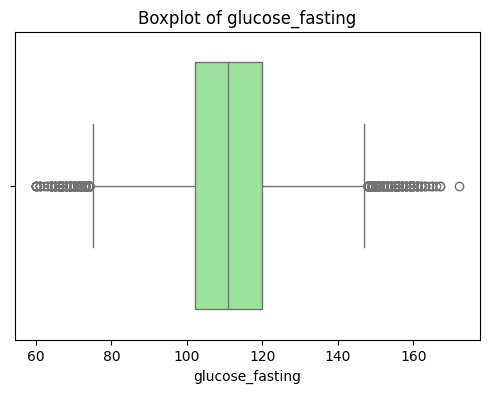

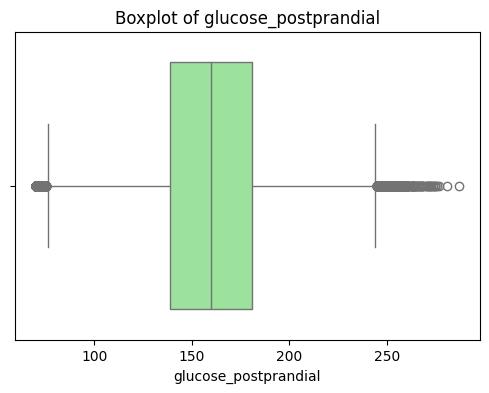

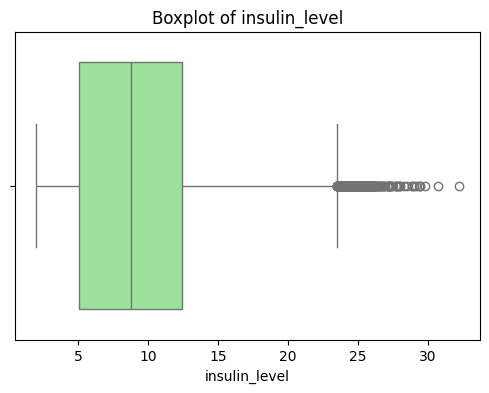

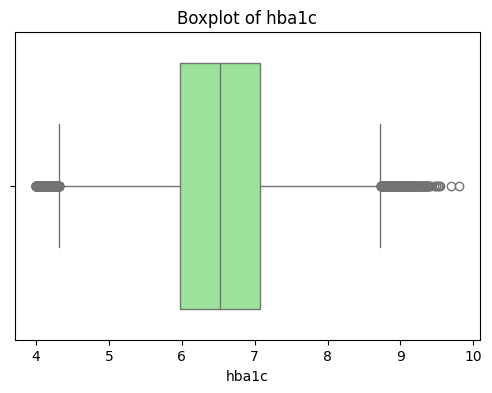

In [23]:
for col in num_cols:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=df_encoded1[col], color='lightgreen')
    plt.title(f'Boxplot of {col}')
    plt.show()


In [24]:
for i in df_encoded1.columns:
    print(i,'---',df_encoded1[i].unique())



age --- [58 48 60 74 46 75 62 42 59 43 54 19 22 41 34 55 35 27 73 51 52 32 56 40
 45 80 50 33 63 30 53 29 26 38 67 44 39 66 65 37 47 31 72 49 18 89 68 28
 85 25 71 24 61 69 57 36 90 64 87 20 84 78 70 76 83 79 23 81 77 21 86 82
 88]
gender --- [1 0 2]
ethnicity --- [0 4 2 1 3]
education_level --- [1 0 3 2]
income_level --- [2 3 1 4 0]
employment_status --- [0 3 1 2]
smoking_status --- [2 1 0]
alcohol_consumption_per_week --- [ 0  1  2  3  6  5  4  9  8  7 10]
physical_activity_minutes_per_week --- [215 143  57  49 109 124  53  75 114  86 118 167  13 364 105  99  31  54
  14 164 128 147 241 185  78 148  88  29 115 182 106 113  51 170  72 133
  34  59 123  71  91  17 175  30  39  77 121 240  80 188  85  56  61  47
  62 180 135 287  73  18 156  74  69 155  97 144 228  60 237 194  44  63
  43 126 103 142  83  40 111  84 198 369 173 130 227  24 179 131 138  70
  42 145 153 317 132  28 207  89 425  94  35 225 141 202  93 217 110 313
 249 171 244  66 200 242  96  41  20  68 119 384  81  64 258

In [25]:

def cap_outliers_iqr(df, cols):

    df_capped = df.copy()
    
    for col in cols:
        if col in df_capped.columns:
            Q1 = df_capped[col].quantile(0.25)
            Q3 = df_capped[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_limit = Q1 - 1.5 * IQR
            upper_limit = Q3 + 1.5 * IQR
            
            # Cap the values
            df_capped[col] = df_capped[col].clip(lower=lower_limit, upper=upper_limit)
    
    return df_capped


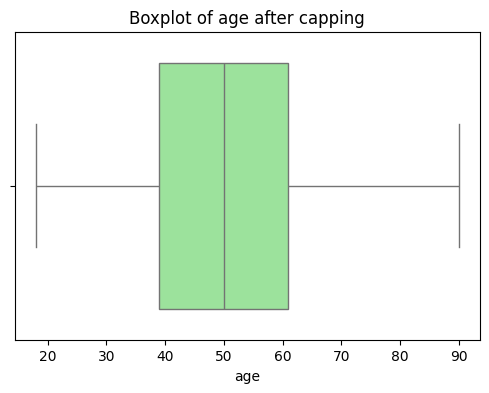

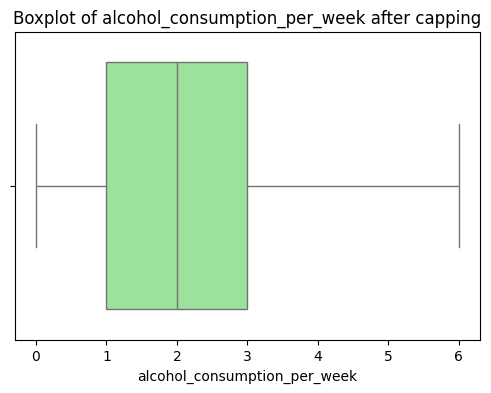

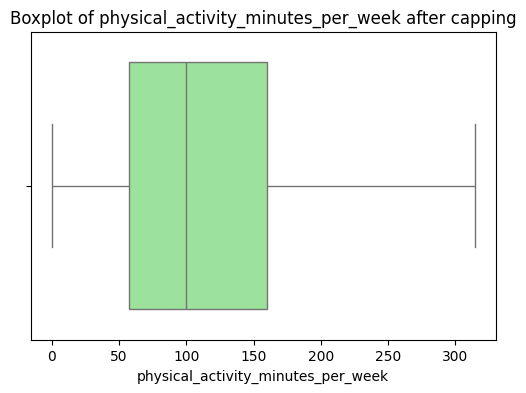

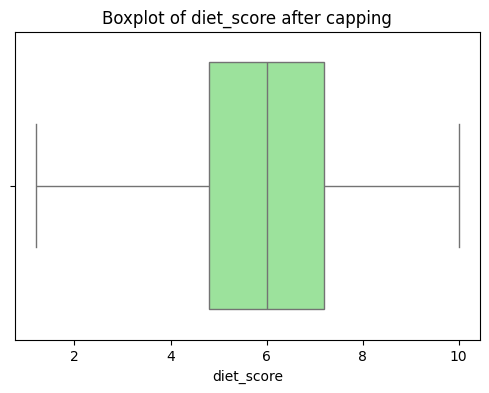

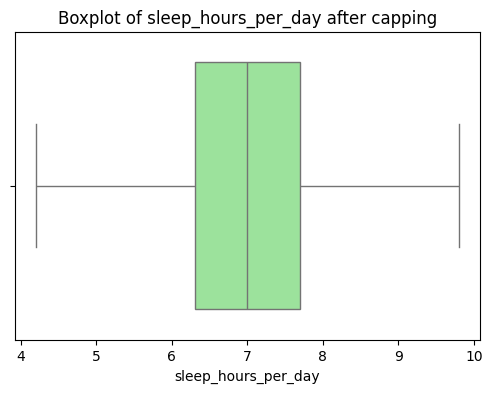

...

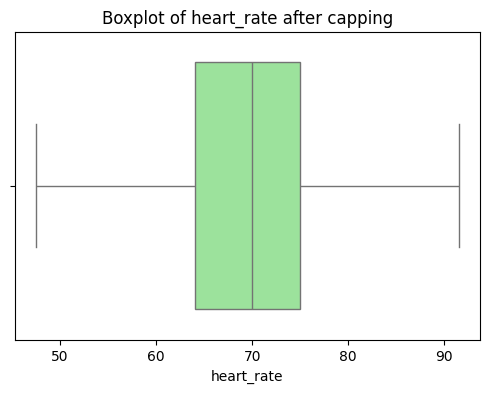

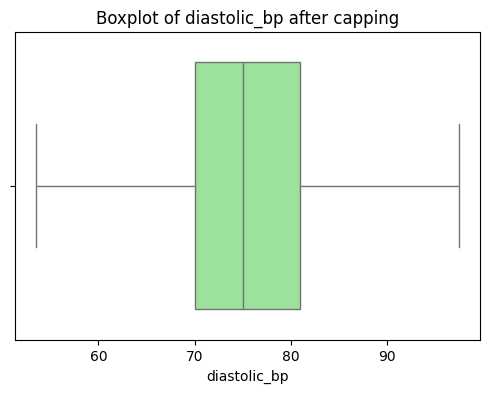

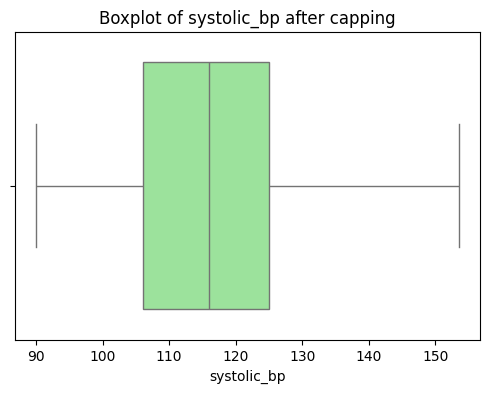

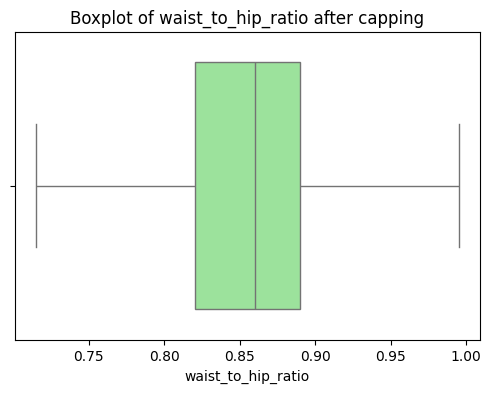

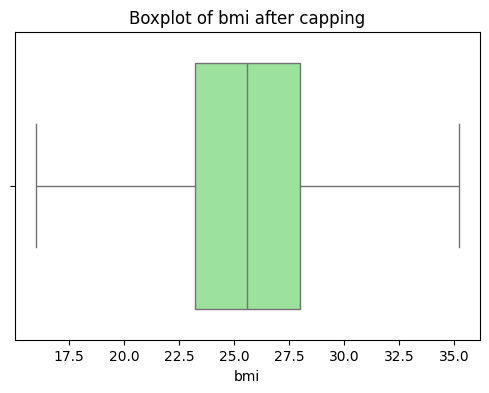

In [26]:
num_cols = ['age', 'alcohol_consumption_per_week', 'physical_activity_minutes_per_week', 'diet_score', 'sleep_hours_per_day', 'screen_time_hours_per_day', 'hba1c', 'insulin_level', 'glucose_postprandial', 'glucose_fasting', 'triglycerides', 'cholesterol_total', 'ldl_cholesterol', 'hdl_cholesterol', 'heart_rate', 'diastolic_bp', 'systolic_bp', 'waist_to_hip_ratio', 'bmi']
df_capped = cap_outliers_iqr(df_encoded1, num_cols)

import matplotlib.pyplot as plt
import seaborn as sns

for col in num_cols:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=df_capped[col], color='lightgreen')
    plt.title(f'Boxplot of {col} after capping')
    plt.show()


In [27]:
df_capped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 29 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 100000 non-null  int64  
 1   gender                              100000 non-null  int64  
 2   ethnicity                           100000 non-null  int64  
 3   education_level                     100000 non-null  int64  
 4   income_level                        100000 non-null  int64  
 5   employment_status                   100000 non-null  int64  
 6   smoking_status                      100000 non-null  int64  
 7   alcohol_consumption_per_week        100000 non-null  int64  
 8   physical_activity_minutes_per_week  100000 non-null  float64
 9   diet_score                          100000 non-null  float64
 10  sleep_hours_per_day                 100000 non-null  float64
 11  screen_time_hours_per_day  

In [28]:
df_capped.describe()

,age,gender,ethnicity,education_level,income_level,employment_status,smoking_status,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,...,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diagnosed_diabetes
count,100000.00000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,...,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,50.12041,0.517970,2.533270,1.00007,2.500500,0.698070,1.39637,1.997900,116.740925,5.996717,...,69.632795,185.947110,54.040930,102.96223,121.419270,111.111570,160.017130,9.056132,6.520332,0.599980
std,15.60460,0.538461,1.490126,1.00013,1.115371,1.024099,0.80174,1.398362,77.345562,1.775302,...,8.306093,31.919469,10.209707,33.27039,43.239212,13.490677,30.802263,4.937706,0.810036,0.489904
min,18.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,1.200000,...,47.500000,100.000000,26.000000,50.00000,30.000000,75.000000,76.000000,2.000000,4.320000,0.000000
25%,39.00000,0.000000,1.000000,0.00000,2.000000,0.000000,1.00000,1.000000,57.000000,4.800000,...,64.000000,164.000000,47.000000,78.00000,91.000000,102.000000,139.000000,5.090000,5.970000,0.000000
50%,50.00000,0.000000,3.000000,1.00000,3.000000,0.000000,2.00000,2.000000,100.000000,6.000000,...,70.000000,186.000000,54.000000,102.00000,121.000000,111.000000,160.000000,8.790000,6.520000,1.000000
75%,61.00000,1.000000,4.000000,1.00000,3.000000,1.000000,2.00000,3.000000,160.000000,7.200000,...,75.000000,208.000000,61.000000,126.00000,151.000000,120.000000,181.000000,12.450000,7.070000,1.000000
max,90.00000,2.000000,4.000000,3.00000,4.000000,3.000000,2.00000,6.000000,314.500000,10.000000,...,91.500000,274.000000,82.000000,198.00000,241.000000,147.000000,244.000000,23.490000,8.720000,1.000000


In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


In [30]:

y = df_encoded1['diagnosed_diabetes']
X = df_encoded1.drop(columns=['diagnosed_diabetes'])


In [38]:
X.columns

Index(['age', 'gender', 'ethnicity', 'education_level', 'income_level',
       'employment_status', 'smoking_status', 'alcohol_consumption_per_week',
       'physical_activity_minutes_per_week', 'diet_score',
       'sleep_hours_per_day', 'screen_time_hours_per_day',
       'family_history_diabetes', 'hypertension_history',
       'cardiovascular_history', 'bmi', 'waist_to_hip_ratio', 'systolic_bp',
       'diastolic_bp', 'heart_rate', 'cholesterol_total', 'hdl_cholesterol',
       'ldl_cholesterol', 'triglycerides', 'glucose_fasting',
       'glucose_postprandial', 'insulin_level', 'hba1c'],
      dtype='object')

In [31]:

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)



In [32]:

rf_model = RandomForestClassifier(random_state=42,class_weight='balanced')
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)


In [33]:

lr_model = LogisticRegression(max_iter=1000, random_state=42,class_weight='balanced')
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)

/home/xlr8/miniconda3/envs/gpu-py311/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [34]:

print("Random Forest WITHOUT Standardization")
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Classification Report:\n", classification_report(y_test, y_pred_rf))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))



Random Forest WITHOUT Standardization
Accuracy: 0.9197
Classification Report:
               precision    recall  f1-score   support

           0       0.83      1.00      0.91      8000
           1       1.00      0.87      0.93     12000

    accuracy                           0.92     20000
   macro avg       0.92      0.93      0.92     20000
weighted avg       0.93      0.92      0.92     20000

Confusion Matrix:
 [[ 7992     8]
 [ 1598 10402]]


In [35]:

print("\nLogistic Regression WITHOUT Standardization")
print("Accuracy:", accuracy_score(y_test, y_pred_lr))
print("Classification Report:\n", classification_report(y_test, y_pred_lr))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_lr))


Logistic Regression WITHOUT Standardization
Accuracy: 0.8418
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.85      0.81      8000
           1       0.89      0.84      0.86     12000

    accuracy                           0.84     20000
   macro avg       0.83      0.84      0.84     20000
weighted avg       0.85      0.84      0.84     20000

Confusion Matrix:
 [[ 6793  1207]
 [ 1957 10043]]


In [ ]:
from sklearn.preprocessing import StandardScaler

def get_continuous_columns(df):

    num_cols = df.select_dtypes(include=['int64', 'float64']).columns
    continuous_cols = [col for col in num_cols if df[col].nunique() > 2]
    return continuous_cols



In [ ]:

continuous_cols = get_continuous_columns(X_train)
scaler = StandardScaler()
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()


In [ ]:

X_train_scaled[continuous_cols] = scaler.fit_transform(X_train[continuous_cols])
X_test_scaled[continuous_cols] = scaler.transform(X_test[continuous_cols])

In [ ]:


rf_model_scaled = RandomForestClassifier(random_state=42,class_weight='balanced')
rf_model_scaled.fit(X_train_scaled, y_train)
y_pred_rf_scaled = rf_model_scaled.predict(X_test_scaled)



In [ ]:

lr_model_scaled = LogisticRegression(max_iter=1000, random_state=42,class_weight='balanced')
lr_model_scaled.fit(X_train_scaled, y_train)
y_pred_lr_scaled = lr_model_scaled.predict(X_test_scaled)


In [ ]:

print("Random Forest WITH Standardization")
print("Accuracy:", accuracy_score(y_test, y_pred_rf_scaled))
print("Classification Report:\n", classification_report(y_test, y_pred_rf_scaled))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf_scaled))


In [ ]:

print("\nLogistic Regression WITH Standardization")
print("Accuracy:", accuracy_score(y_test, y_pred_lr_scaled))
print("Classification Report:\n", classification_report(y_test, y_pred_lr_scaled))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_lr_scaled))

In [ ]:

rf_model_bootstrap = RandomForestClassifier(
    n_estimators=10,
    random_state=4,
    bootstrap=True,       # sample rows
    max_samples=0.8,      # fraction of rows
    max_features=0.7   ,   # fraction of columns
    class_weight='balanced'
)


In [ ]:

rf_model_bootstrap.fit(X_train_scaled, y_train)
y_pred_rf_bootstrap = rf_model_bootstrap.predict(X_test_scaled)


In [ ]:

print("Random Forest WITH Bootstrap & Column Sampling")
print("Accuracy:", accuracy_score(y_test, y_pred_rf_bootstrap))
print("Classification Report:\n", classification_report(y_test, y_pred_rf_bootstrap))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf_bootstrap))


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rf_model = RandomForestClassifier(
    random_state=4,
    bootstrap=True,
    max_samples=0.8,
    max_features=0.7,
    class_weight='balanced'
)


In [97]:
param_grid = {
    'n_estimators': [10,15],        # number of trees
    'max_depth': [5,10,15],       # depth of trees
    'min_samples_split': [2,3,4],       # minimum samples to split node
    'min_samples_leaf': [1, 2]          # minimum samples per leaf
}


In [98]:

grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    cv=5,
    n_jobs=-1,
    scoring='f1',       
    verbose=2
)


In [99]:

# Fit Grid Search on training data
grid_search.fit(X_train,y_train)


Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   2.5s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   2.4s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   2.5s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   2.5s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=10; total time=   2.5s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=15; total time=   3.6s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=15; total time=   3.6s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=15; total time=   3.7s
[CV] END max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=15; total time=   3.6s
[CV] END max_depth=5, min_samples_leaf=1, min_s

,estimator,RandomForestC...andom_state=4)
,param_grid,"{'max_depth': [5, 10, ...], 'min_samples_leaf': [1, 2], 'min_samples_split': [2, 3, ...], 'n_estimators': [10, 15]}"
,scoring,'f1'
,n_jobs,-1
,refit,True
,cv,5
,verbose,2
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,n_estimators,10


In [100]:


print("Best Parameters:", grid_search.best_params_)
best_rf_model = grid_search.best_estimator_


Best Parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 10}


In [101]:
best_rf_model.fit(X_train, y_train)


,n_estimators,10
,criterion,'gini'
,max_depth,10
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,0.7
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [103]:
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

y_pred = best_rf_model.predict(X_test)


In [104]:

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Accuracy: 0.92
Classification Report:
               precision    recall  f1-score   support

           0       0.83      1.00      0.91      8000
           1       1.00      0.87      0.93     12000

    accuracy                           0.92     20000
   macro avg       0.92      0.93      0.92     20000
weighted avg       0.93      0.92      0.92     20000

Confusion Matrix:
 [[ 8000     0]
 [ 1600 10400]]
